
#El método de Runge-Kutta de orden cuatro

El método de Runge-Kutta de orden cuatro es un método numérico para resolver ecuaciones diferenciales ordinarias. Se basa en aproximar la solución a 

\begin{equation}
\frac{\mathrm{d}y}{\mathrm{d}t} = f(t, y)
\end{equation}

con condiciones iniciales $y(t_0)=y_0$ a:


\begin{equation}
y_{n+1} = y_n + \frac{h}{6}(k_1 + 2k_2 + 2k_3 + k_4)
\end{equation}

donde $h$ es el tamaño del paso y
\begin{equation}
k_1 = f(t_n, y_n)
\end{equation}
\begin{equation}
k_2 = f(t_n + \frac{h}{2}, y_n + \frac{h}{2}k_1)
\end{equation}
\begin{equation}
k_3 = f(t_n + \frac{h}{2}, y_n + \frac{h}{2}k_2)
\end{equation}
\begin{equation}
k_4 = f(t_n + h, y_n + hk_3)
\end{equation}
El orden de convergencia del método es cuatro, lo que significa que el error local es proporcional a $h^5$ y el error global es proporcional a $h^4$.


In [19]:
#@title Librerías 
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [20]:
#@title condición inicial
y0=100
a=1
params=(a,)
t0=0  #tiempo inicial 
tfin=1  #tiempo final
Nt=100 #númeor de tiempos 
t=np.linspace(t0,tfin,Nt)

In [21]:
def funcion(t,y,params):
  a=params[0]
  dydt=-a*y
  return dydt

In [22]:
def runge_kutta(t0,tfin,y0,Nt,a):
  params=(a,)
  array=np.zeros(Nt) 
  t=np.linspace(t0,tfin,Nt)
  h=1/Nt

  for t in range(0,Nt):
    k1=funcion(t0,y0,params)
    k2=funcion(t0+h/2,y0+h/2*k1,params)
    k3=funcion(t0+h/2,y0+h/2*k2,params)
    k4=funcion(t0+h,y0+h*k3,params)
    kmean=(1/6)*(k1+2*k2+2*k3+k4)
    y1=y0+kmean*h
    array[t]=y1
    t1=t0+h
    t0=t1
    y0=y1

  return array

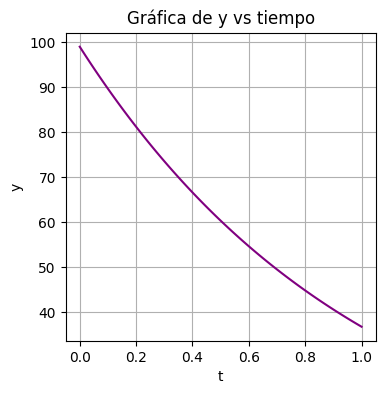

In [23]:
sln=runge_kutta(t0,tfin,y0,Nt,a)
#Graficando 
plt.figure(figsize=(4,4))
plt.plot(t,sln,color='purple')
plt.xlabel('t')
plt.ylabel('y')
plt.title('Gráfica de y vs tiempo')
plt.grid()

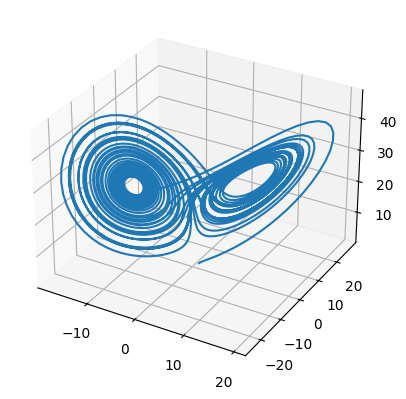

In [24]:
#@title Código de wikipedia con odeint
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from mpl_toolkits.mplot3d import Axes3D

rho = 28.0
sigma = 10.0
beta = 8.0 / 3.0

def f(state, t):
    x, y, z = state  # Desempaqueta el vector de estado
    return sigma * (y - x), x * (rho - z) - y, x * y - beta * z  # Derivadas

state0 = [1.0, 1.0, 1.0]
t = np.arange(0.0, 40.0, 0.01)

states = odeint(f, state0, t)

fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.plot(states[:, 0], states[:, 1], states[:, 2])
plt.show()


# Atractor de Lorenz con el método visto en clase 



El sistema de Lorenz es:

$$
\begin{aligned}
\frac{dx}{dt} &= \sigma (y - x) \\
\frac{dy}{dt} &= x (\rho - z) - y \\
\frac{dz}{dt} &= xy - \beta z
\end{aligned}
$$


In [26]:
#@title condiciones iniciales
x0=1
y0=1
z0=1
a = 10.0
b = 97
c = 8.0 / 3.0
r0=np.array([x0,y0,z0])
params=np.array([a,b,c])
t0=0
tfin=40
dt = h = 0.001
t = np.arange(0, 40, dt)

In [27]:
#definimos una funcion para cada una de las variables 
def func_x(t,x,y,z,params):
  a=params[0]
  dxdt=a*(y-x)
  return dxdt

def func_y(t,x,y,z,params):
  a=params[0]
  b=params[1]
  dydt=x*(b-z)-y
  return dydt

def func_z(t,x,y,z,params):
  a=params[0]
  c=params[2]
  dzdt=x*y-c*z
  return dzdt

In [29]:
#@title Rungekutta
def runge_kutta(t0,tfin,r0,params):
  x0=r0[0]
  y0=r0[1]
  z0=r0[2]
  h = 0.001
  t = np.arange(t0, tfin, h)
  arrX=np.zeros(len(t)) 
  arrY=np.zeros(len(t))
  arrZ=np.zeros(len(t))


  for i in range(0,len(t)):
    k1=func_x(t0,x0,y0,z0,params)
    k2=func_x(t0+h/2,x0+h/2*k1,y0,z0,params)
    k3=func_x(t0+h/2,x0+h/2*k2,y0,z0,params)
    k4=func_x(t0+h,x0+h*k3,y0,z0,params)
    kmean=(1/6)*(k1+2*k2+2*k3+k4)
    x1=x0+kmean*h
    

    c1=func_y(t0,x0,y0,z0,params)
    c2=func_y(t0+h/2,x0,y0+h/2*c1,z0,params)
    c3=func_y(t0+h/2,x0,y0+h/2*c2,z0,params)
    c4=func_y(t0+h,x0,y0+h*c3,z0,params)
    cmean=(1/6)*(c1+2*c2+2*c3+c4)
    y1=y0+cmean*h
    

    d1=func_z(t0,x0,y0,z0,params)
    d2=func_z(t0+h/2,x0,y0,z0+h/2*d1,params)
    d3=func_z(t0+h/2,x0,y0,z0+h/2*d2,params)
    d4=func_z(t0+h,x0,y0,z0+h*d3,params)
    dmean=(1/6)*(d1+2*d2+2*d3+d4)
    z1=z0+dmean*h

    arrX[i]=x1
    arrY[i]=y1
    arrZ[i]=z1

    t1=t0+h
    t0=t1
    x0=x1
    y0=y1
    z0=z1
  return np.array([arrX,arrY,arrZ])

In [30]:
atr=runge_kutta(t0,tfin,r0,params)
x=atr[0]
y=atr[1]
z=atr[2]

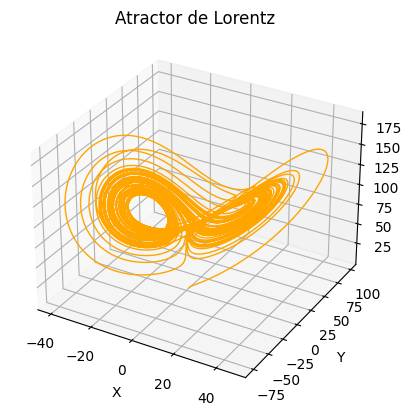

In [31]:
# Grafica
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(x, y, z,color='orange',linewidth=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Atractor de Lorentz')
plt.show()

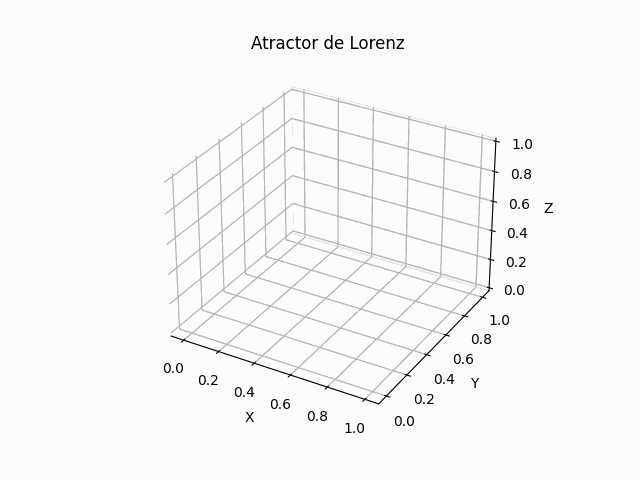

In [32]:

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

def update_animation(i):
    ax.clear()
    ax.plot(x[:i], y[:i], z[:i], color='orange')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Atractor de Lorenz')

# Crear la animación
animation = animation.FuncAnimation(fig, update_animation, frames=3000)

# Guardar la animación como archivo GIF
animation.save('animation.gif', writer='pillow')
plt.close()

# Mostrar el archivo GIF
from IPython.display import Image
Image(filename='animation.gif')
